In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img01 = cv2.imread('./StereoImages/01.jpeg',0)  #queryimage # left image
img02 = cv2.imread('./StereoImages/02.jpeg',0) #trainimage # right image

# 
mtx = np.array([[3.27894981e+03, 0.00000000e+00, 2.05358222e+03],
 [0.00000000e+00, 3.29320263e+03, 1.49021929e+03],
 [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])
dist = np.array([[ 2.83092458e-01, -1.66799155e+00, -1.62644698e-03,  4.04708463e-04, 3.04420786e+00]])

# undistort
img1 = cv2.undistort(img01, mtx, dist, None, mtx)
img2 = cv2.undistort(img02, mtx, dist, None, mtx)

# h, w = img01.shape[:2]
# newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
# # crop the image
# x,y,w,h = roi
# img1 = img1[y:y+h, x:x+w]
# img2 = img2[y:y+h, x:x+w]
# cv2.imwrite('./UndistImgs/undist01.jpeg',img1)
# cv2.imwrite('./UndistImgs/undist01.jpeg',img2)

In [2]:
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)

In [3]:
good = []
pts1 = []
pts2 = []

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.7*n.distance:
        good.append(m)
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)

pts1 = np.float32(pts1)
pts2 = np.float32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)

# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

In [4]:
# def drawlines(img1,img2,lines,pts1,pts2):
#     ''' img1 - image on which we draw the epilines for the points in img2
#         lines - corresponding epilines '''
#     r,c = img1.shape
#     img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
#     img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
#     for r,pt1,pt2 in zip(lines,pts1,pts2):
#         color = tuple(np.random.randint(0,255,3).tolist())
#         x0,y0 = map(int, [0, -r[2]/r[1] ])
#         x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
#         img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
#         img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
#         img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
#     return img1,img2

# # Find epilines corresponding to points in right image (second image) and
# # drawing its lines on left image
# lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
# lines1 = lines1.reshape(-1,3)
# img5,img6 = drawlines(img1,img2,lines1,pts1,pts2)

# # Find epilines corresponding to points in left image (first image) and
# # drawing its lines on right image
# lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
# lines2 = lines2.reshape(-1,3)
# img3,img4 = drawlines(img2,img1,lines2,pts2,pts1)

# plt.figure(figsize=(15,15))
# plt.subplot(121),plt.imshow(img5)
# plt.subplot(122),plt.imshow(img3)
# plt.show()

In [5]:
# # Need to draw only good matches, so create a mask
# matchesMask = [[0,0] for i in xrange(len(matches))]
# # ratio test as per Lowe's paper
# for i,(m,n) in enumerate(matches):
#     if m.distance < 0.3*n.distance:
#         matchesMask[i]=[1,0]
        
# draw_params = dict(matchColor = (0,255,0),
#                    singlePointColor = (255,0,0),
#                    matchesMask = matchesMask,
#                    flags = 0)
# img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)
# plt.figure(figsize=(15,15))
# plt.imshow(img3,),plt.show()

F = : [[ 4.46473920e-08 -1.00083841e-05 -1.14712559e-03]
 [ 1.12085563e-05 -2.87538608e-07 -1.07933301e-01]
 [ 6.98916194e-04  1.07845045e-01  1.00000000e+00]]
E = : [[ 0.0012997  -0.25979201 -0.1123907 ]
 [ 0.30396924 -0.00688388 -0.62843314]
 [ 0.12823114  0.64497002  0.00850391]]
R = : [[ 9.97287620e-01 -2.49650851e-02  6.92397867e-02]
 [ 2.49476668e-02  9.99688135e-01  1.11641118e-03]
 [-6.92460646e-02  6.13988086e-04  9.97599421e-01]]
t = : [[-0.91637848]
 [ 0.15891575]
 [-0.36741839]]
8.77596609398044


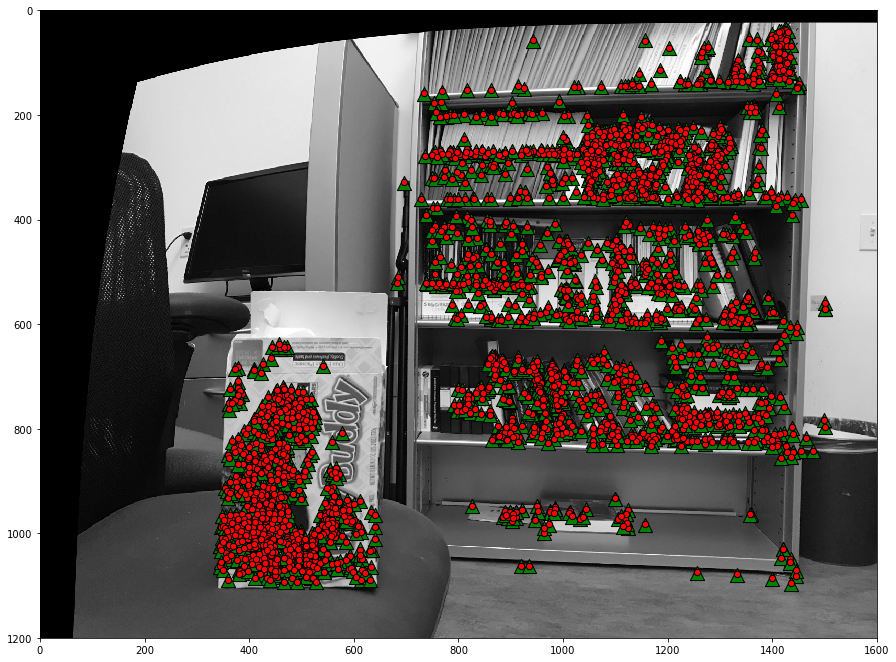

In [13]:
# Normalize for Esential Matrix calaculation
# pts_l_norm = cv2.undistort(np.expand_dims(pts1, axis=1), cameraMatrix=mtx, distCoeffs=None)
# pts_r_norm = cv2.undistort(np.expand_dims(pts2, axis=1), cameraMatrix=mtx, distCoeffs=None)

pts_l = pts1; pts_r = pts2
pts_l_norm = pts1; pts_r_norm = pts2
K_l = mtx
K_r = mtx

E, mask = cv2.findEssentialMat(pts_l_norm, pts_r_norm, mtx)

R1,R2,t = cv2.decomposeEssentialMat(E)
#print R1
#print R2, t
M_r1 = np.hstack((R2, t))
M_r2 = np.hstack((R1, t))
M_r3 = np.hstack((R2, t*(-1)))
M_r4 = np.hstack((R1, t*(-1)))
M_l = np.hstack((np.eye(3, 3), np.zeros((3, 1))))
P_l = np.dot(K_l,  M_l)
P_r = np.dot(K_r,  M_r4)

t = t*(-1)
R = R1
# t = t
# R = R2

print 'F = :', F
print 'E = :', E
print 'R = :', R
print 't = :', t

pts4d = cv2.triangulatePoints(P_l, P_r, np.array(np.transpose(pts1)), np.array(np.transpose(pts2)))
X_vector = [float(pts4d[0][i])/float(pts4d[3][i]) for i in range(len(pts4d[0])) if pts4d[3][i]!=0]
Y_vector = [float(pts4d[1][i])/float(pts4d[3][i]) for i in range(len(pts4d[0])) if pts4d[3][i]!=0]
Z_vector = [float(pts4d[2][i])/float(pts4d[3][i]) for i in range(len(pts4d[0])) if pts4d[3][i]!=0]
Z_vector = np.array(Z_vector)
print(Z_vector.min())
pts3D = np.vstack((X_vector,Y_vector,Z_vector))

proj_pt3D = np.matmul(mtx, pts3D)

x_vector = [float(proj_pt3D[0][i])/float(proj_pt3D[2][i]) for i in range(len(proj_pt3D[0])) if proj_pt3D[2][i]!=0]
y_vector = [float(proj_pt3D[1][i])/float(proj_pt3D[2][i]) for i in range(len(proj_pt3D[0])) if proj_pt3D[2][i]!=0]
proj_pt3D = np.vstack((x_vector,y_vector))

plt.figure(figsize=(15,15))
# RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img1,cmap="gray")
plt.scatter(pts1[:,0], pts1[:,1], s=200, marker='^', c = 'g', edgecolors= 'black')
plt.scatter(x_vector, y_vector, s=40 , marker='o', c = 'r', edgecolors= 'black')
plt.show()

In [30]:
zmax = Z_vector.max()
zmin = Z_vector.min()
interval = (zmax - zmin)/20
print(zmax)
print(zmin)
print(interval)
pts3Dt = np.transpose(pts3D)

d = np.linspace(zmin,zmax,20)
print(d)

58.15069955431232
8.77596609398044
1.968736673016594
[ 8.77596609 11.37463628 13.97330646 16.57197664 19.17064682 21.769317
 24.36798719 26.96665737 29.56532755 32.16399773 34.76266792 37.3613381
 39.96000828 42.55867846 45.15734864 47.75601883 50.35468901 52.95335919
 55.55202937 58.15069955]


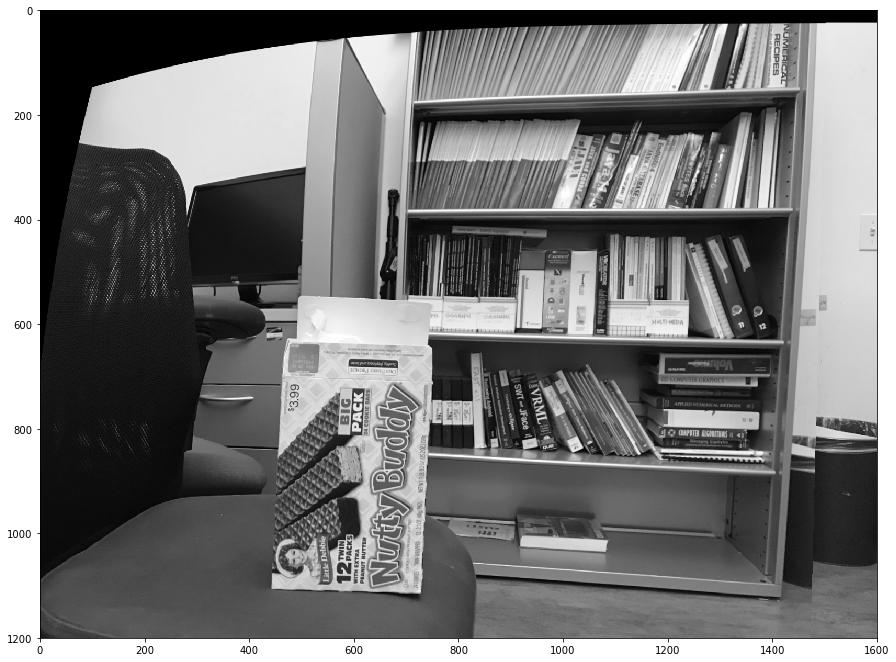

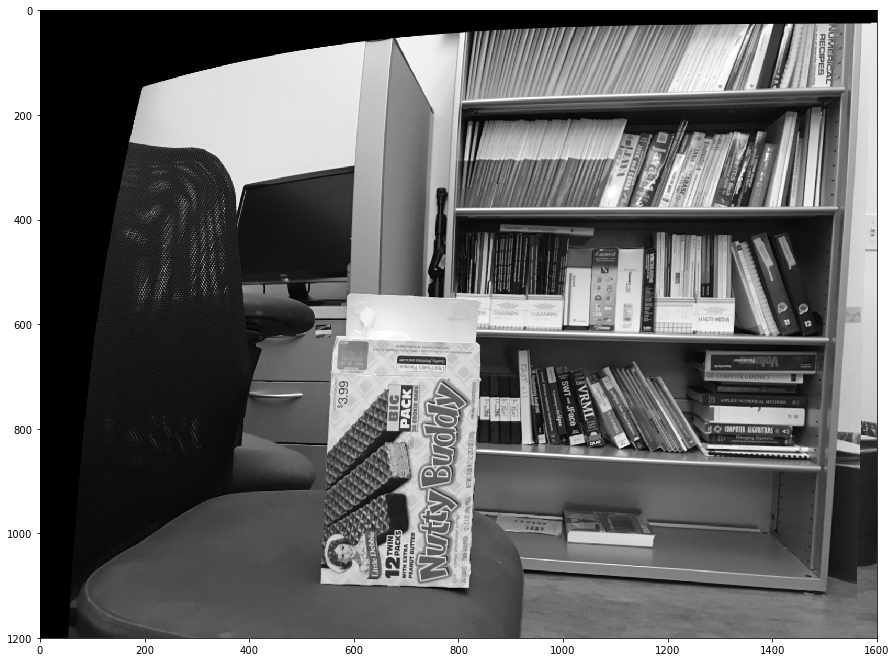

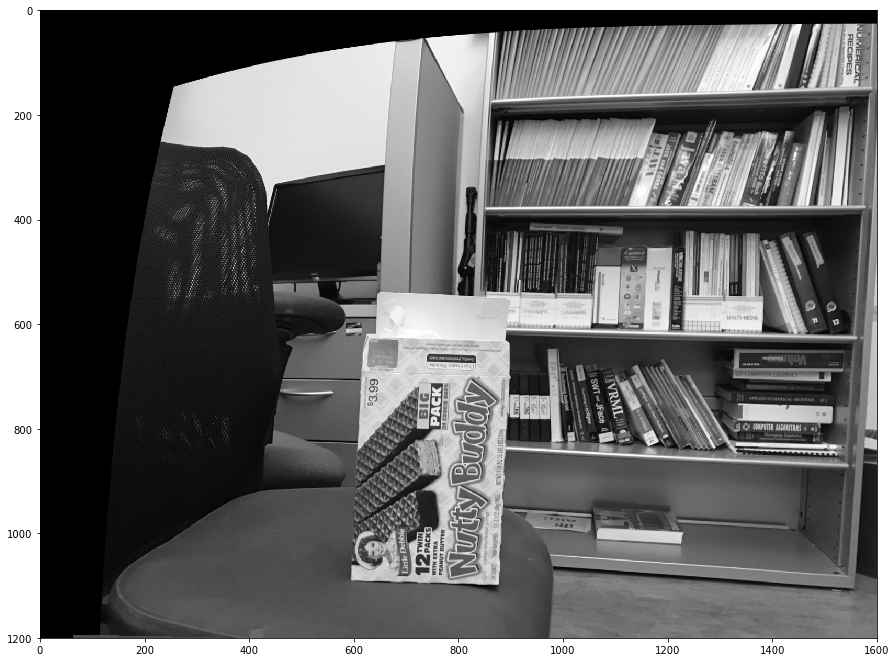

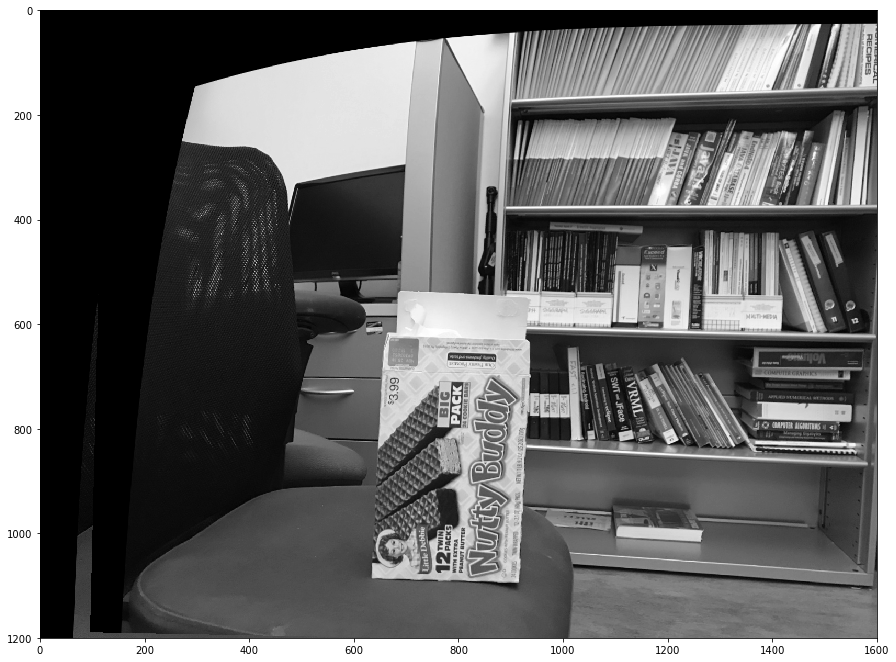

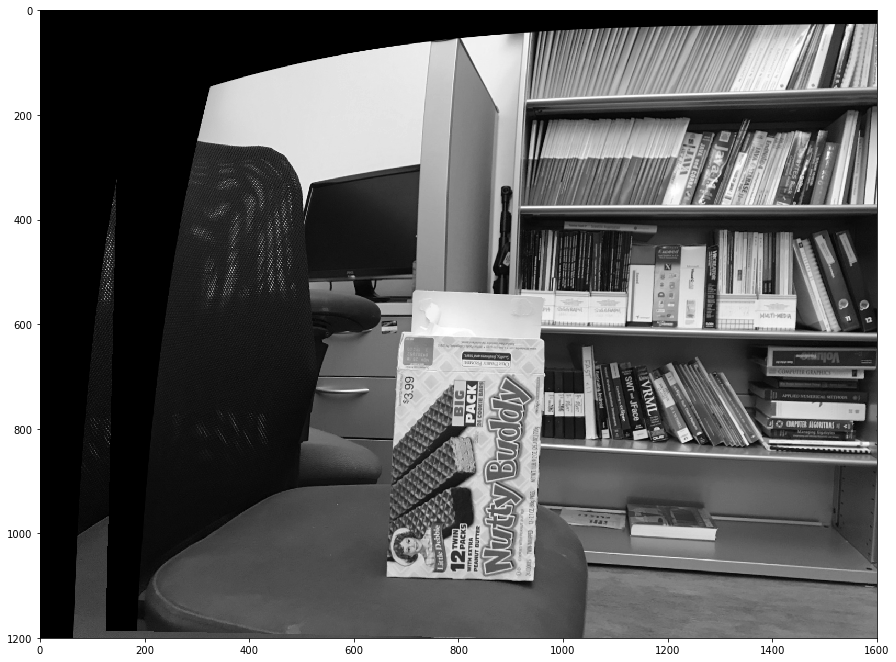

...

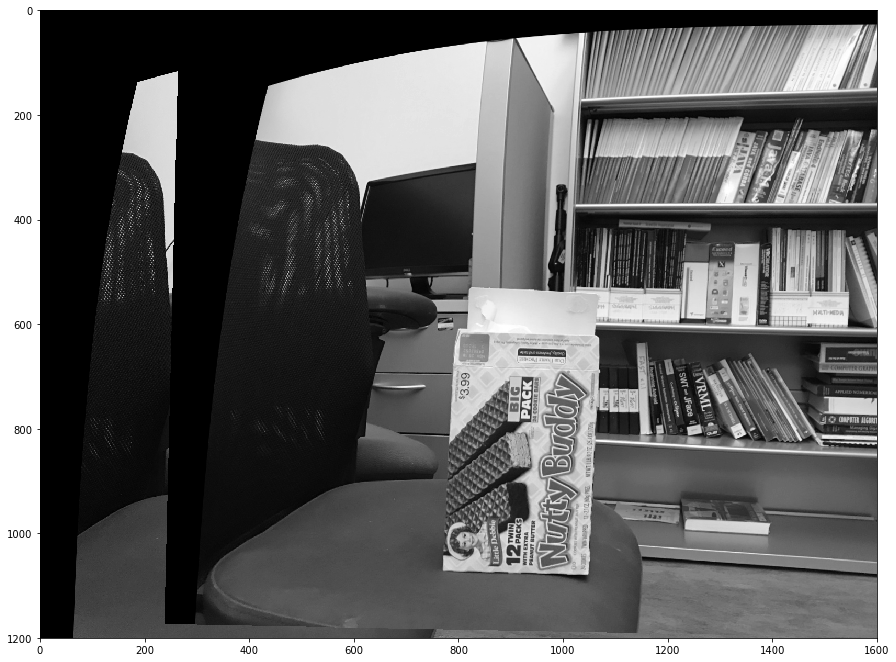

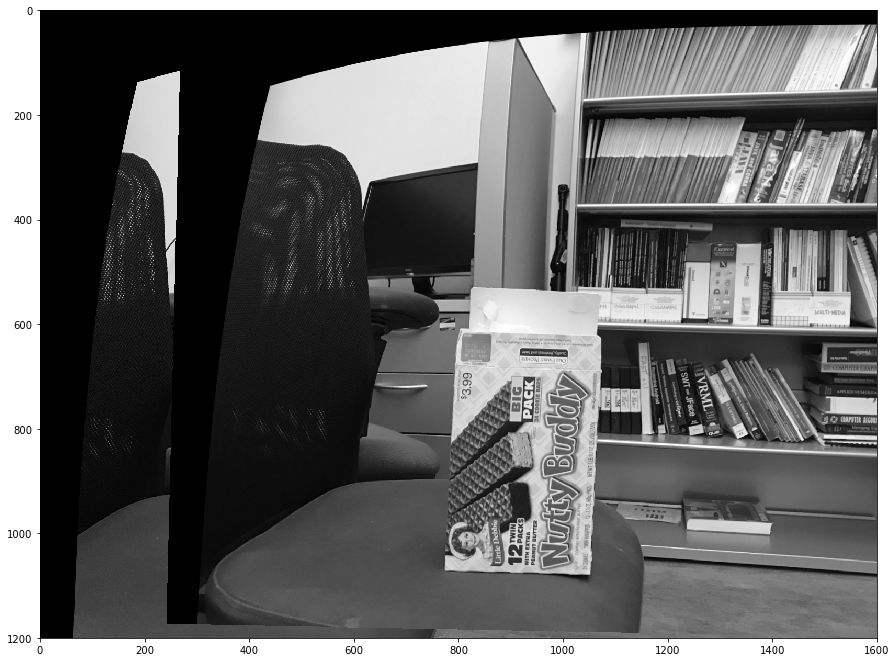

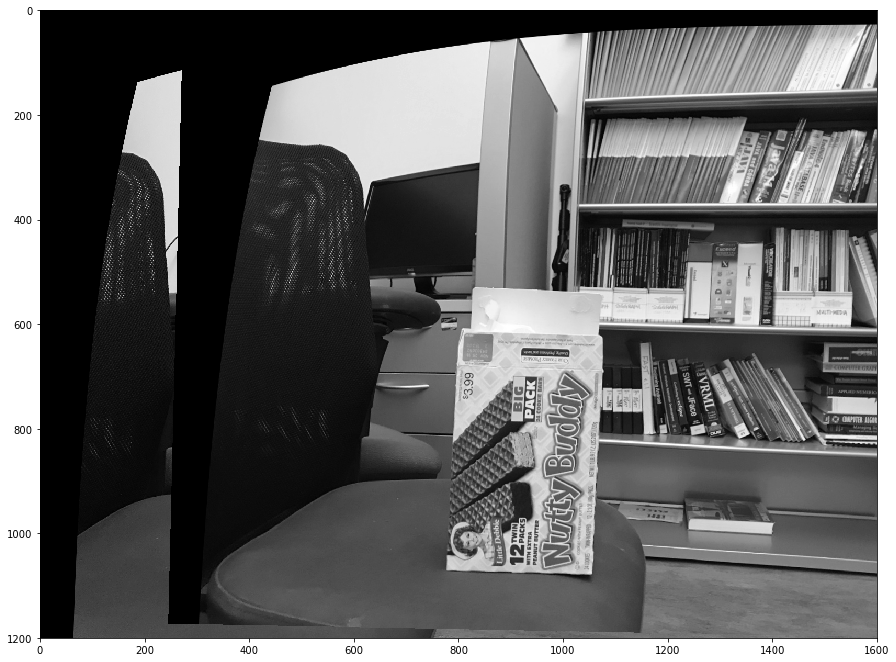

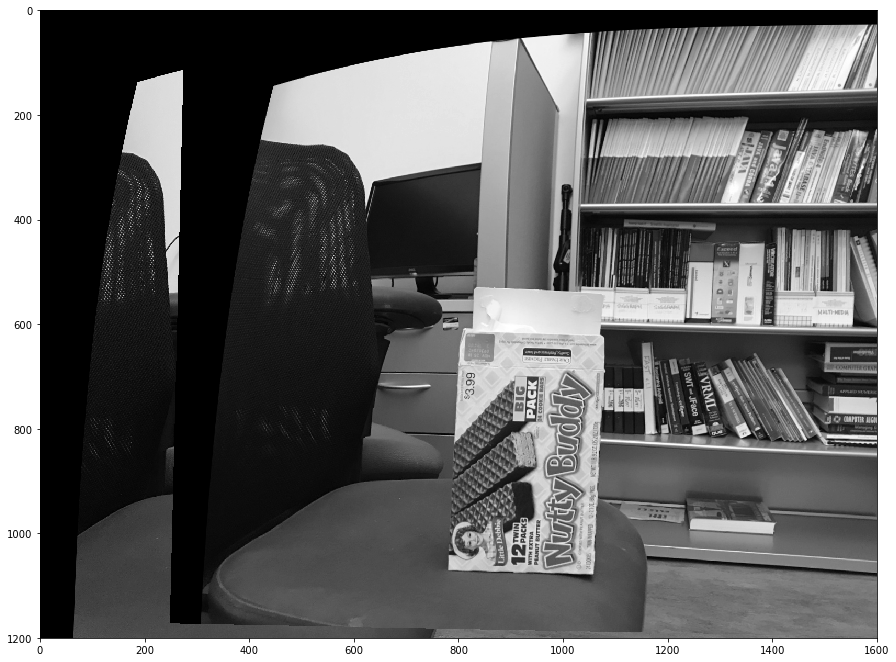

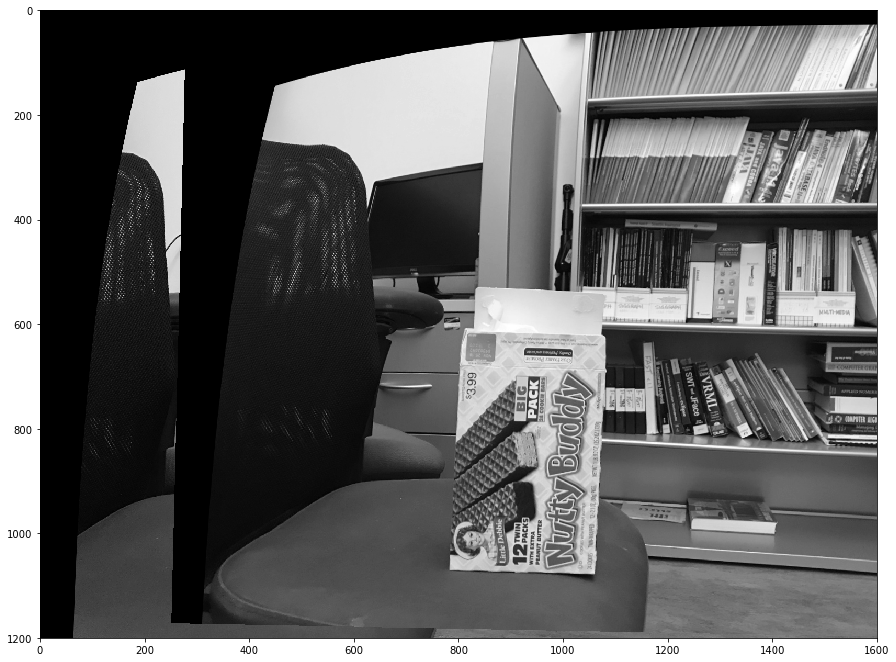

In [31]:
for i in range(20):
    n = np.array([[0,0,-1]])
    H = R - np.dot(t,n)/d[i]
    M = np.matmul(mtx,np.matmul(H,np.linalg.inv(mtx)))
    warp = cv2.warpPerspective(img2, M, (img1.shape[1], img1.shape[0]), dst=img1.copy(), borderMode=cv2.BORDER_TRANSPARENT)

    plt.figure(figsize=(15,15))
    # RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(warp,cmap="gray")
    plt.show()

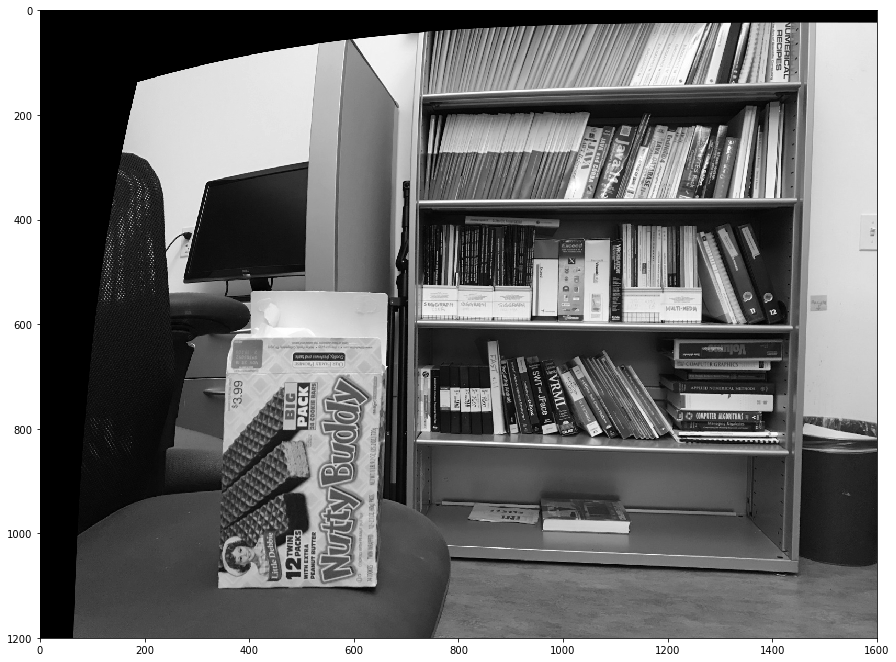

In [32]:
plt.figure(figsize=(15,15))
# RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img1,cmap="gray")
plt.show()

In [11]:
# plt.figure(figsize=(20,20))
# plt.imshow(im1,cmap="gray")
# plt.show()
# plt.figure(figsize=(20,20))
# plt.imshow(im2,cmap="gray")
# plt.show()
# plt.figure(figsize=(20,20))
# plt.imshow(out1,cmap="gray")
# plt.show()

In [12]:
# def feature_matching(img1, img2, savefig=False):
#     # Initiate SIFT detector
#     sift = cv2.xfeatures2d.SIFT_create()
#     # find the keypoints and descriptors with SIFT
#     kp1, des1 = sift.detectAndCompute(img1, None)
#     kp2, des2 = sift.detectAndCompute(img2, None)
#     # FLANN parameters
#     FLANN_INDEX_KDTREE = 1
#     index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
#     search_params = dict(checks=50)  # or pass empty dictionary
#     flann = cv2.FlannBasedMatcher(index_params, search_params)
#     matches2to1 = flann.knnMatch(des2, des1, k=2)

#     matchesMask_ratio = [[0, 0] for i in xrange(len(matches2to1))]
#     match_dict = {}
#     for i, (m, n) in enumerate(matches2to1):
#         if m.distance < 0.7 * n.distance:
#             matchesMask_ratio[i] = [1, 0]
#             match_dict[m.trainIdx] = m.queryIdx

#     good = []
#     recip_matches = flann.knnMatch(des1, des2, k=2)
#     matchesMask_ratio_recip = [[0, 0] for i in xrange(len(recip_matches))]

#     for i, (m, n) in enumerate(recip_matches):
#         if m.distance < 0.7 * n.distance:  # ratio
#             if m.queryIdx in match_dict and match_dict[m.
#                                                        queryIdx] == m.trainIdx:  #reciprocal
#                 good.append(m)
#                 matchesMask_ratio_recip[i] = [1, 0]

#     if savefig:
#         draw_params = dict(
#             matchColor=(0, 255, 0),
#             singlePointColor=(255, 0, 0),
#             matchesMask=matchesMask_ratio_recip,
#             flags=0)
#         img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, recip_matches, None,
#                                   **draw_params)

#         plt.figure(), plt.xticks([]), plt.yticks([])
#         plt.imshow(img3,)
#         plt.savefig("feature_matching.png", bbox_inches='tight')

#     return ([kp1[m.queryIdx].pt
#              for m in good], [kp2[m.trainIdx].pt for m in good])


# def getTransform(src, dst, method='affine'):
#     pts1, pts2 = feature_matching(src, dst)

#     src_pts = np.float32(pts1).reshape(-1, 1, 2)
#     dst_pts = np.float32(pts2).reshape(-1, 1, 2)

#     if method == 'affine':
#         M, mask = cv2.estimateAffine2D(
#             src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold=5.0)
#         M = np.append(M, [[0, 0, 1]], axis=0)

#     if method == 'homography':
#         M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

#     matchesMask = mask.ravel().tolist()

#     return (M, pts1, pts2, mask)

# def Perspective_warping(img1, img2, img3):

#     im1 = img1
#     im2 = img2
#     im3 = img3

#     im1 = cv2.copyMakeBorder(im1, 200, 200, 500, 500, cv2.BORDER_CONSTANT)
#     (M1, pts2, pts1, mask) = getTransform(im2, im1, method='homography')
#     out1 = cv2.warpPerspective(
#         im2,
#         M1, (im1.shape[1], im1.shape[0]),
#         dst=im1.copy(),
#         borderMode=cv2.BORDER_TRANSPARENT)

#     (M2, pts2, pts1, mask) = getTransform(im3, out1, method='homography')
#     out = cv2.warpPerspective(
#         im3,
#         M2, (im1.shape[1], im1.shape[0]),
#         dst=out1.copy(),
#         borderMode=cv2.BORDER_TRANSPARENT)

#     output_image = out

#     output_name = sys.argv[5] + "output_homography.png"
#     cv2.imwrite(output_name, output_image)

#     return True

# im1 = cv2.imread('./StereoImages/01.jpeg',0)
# im2 = cv2.imread('./StereoImages/02.jpeg',0)
# im3 = cv2.imread('./StereoImages/02.jpeg',0)

# im1 = cv2.copyMakeBorder(im1, 200, 200, 500, 500, cv2.BORDER_CONSTANT)
# (M1, pts2, pts1, mask) = getTransform(im2, im1, method='homography')
# out1 = cv2.warpPerspective(
#     im2,
#     M1, (im1.shape[1], im1.shape[0]),
#     dst=im1.copy(),
#     borderMode=cv2.BORDER_TRANSPARENT)

# plt.figure(figsize=(20,20))
# plt.imshow(im1,cmap="gray")
# plt.show()
# plt.figure(figsize=(20,20))
# plt.imshow(im2,cmap="gray")
# plt.show()
# plt.figure(figsize=(20,20))
# plt.imshow(out1,cmap="gray")
# plt.show()